# Предиктор результатов футбольных матчей

In [52]:
#importing
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from seaborn import heatmap

from sklearnex import patch_sklearn # эти строки должны идти перед импортом sklearn
patch_sklearn()                     # для ускорения работы

# from sklearn.model_selection    import train_test_split, StratifiedGroupKFold, GridSearchCV, RandomizedSearchCV
# from sklearn.metrics            import accuracy_score, roc_auc_score, RocCurveDisplay, auc, roc_curve
# from sklearn.linear_model       import LogisticRegression
# from sklearn.preprocessing      import LabelBinarizer
# from sklearn.tree               import DecisionTreeClassifier
# from sklearn.ensemble           import RandomForestClassifier
# from sklearn.inspection         import permutation_importance

# from catboost import CatBoostClassifier, Pool, metrics

# import shap

# from itertools import cycle

from joblib import dump

n_jobs = -1
data_name = "data_short"

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


## Обзор данных

In [53]:
data = pd.read_csv(data_name + ".csv")
data.head()

,idmatch,odds_open_win1,odds_open_draw,odds_open_win2,vi_win_home,vi_win_away,vi_nolose_home,vi_nolose_away,vi_over25_home,vi_over25_away,...,team2_away_xgpower_draw_xga90index,team2_away_xgpower_draw_xgsubxgaindex,team2_away_xgpower_03_xg_xg90index,team2_away_xgpower_03_xg_xga90index,team2_away_xgpower_03_xg_xgsubxgaindex,team2_away_xgpower_03_draw_xg90index,team2_away_xgpower_03_draw_xga90index,team2_away_xgpower_03_draw_xgsubxgaindex,result_finish_match,result_total_match
0,39231,2.53,3.15,3.02,2.255,-4.318,19.259,-3.855,-41.798,-10.410,...,1.02,0.32,0.65,1.78,0.36,0.40,0.98,0.40,2.0,0.0
1,39232,2.16,3.26,3.66,-13.230,-29.496,4.164,-47.122,-43.926,-4.662,...,1.04,0.29,0.81,0.88,0.92,0.44,1.23,0.36,1.0,0.0
2,39233,2.35,3.16,3.31,-35.270,-1.048,-17.721,-2.781,8.467,-6.808,...,0.85,0.23,0.24,0.67,0.35,0.27,0.87,0.31,3.0,1.0
3,39235,2.50,3.25,2.97,17.593,27.970,1.079,10.260,-27.452,-23.279,...,3.63,0.02,0.42,0.75,0.56,0.10,1.99,0.05,3.0,1.0
4,45425,2.15,3.49,3.46,19.656,-22.231,-8.999,-8.685,7.560,-7.321,...,0.57,2.14,1.12,1.67,0.67,0.93,0.64,1.45,1.0,1.0


In [54]:
with open("raw_data_info.txt", mode='w') as df_info:
    data.info(verbose=True, show_counts=True, buf=df_info)
print('\nБаланс классов\n')
print(data['result_finish_match'].value_counts(), '\n')
print(data['result_total_match'].value_counts())


Баланс классов

result_finish_match
1.0    24763
3.0    17585
2.0    15099
Name: count, dtype: int64 

result_total_match
0.0    29307
1.0    28140
Name: count, dtype: int64


Классы более или менее сбалансированны.

# Предобработка

Удаляем строки, в которых пропущен хотя бы один столбец из `"odds_open_win1", "odds_open_draw", "odds_open_win2"`. Оставшиеся пропуски заменяме медианными по столбцам значениями.

In [55]:
data.dropna(inplace=True, subset=["odds_open_win1", "odds_open_draw", "odds_open_win2"])
data.fillna(data.median(axis=0), inplace=True)

assert np.all(data.notna())

## Понижение размерности
Посмотрим на матрицу корреляций *(картинка только для уменьшенного датасета)*:

<Axes: >

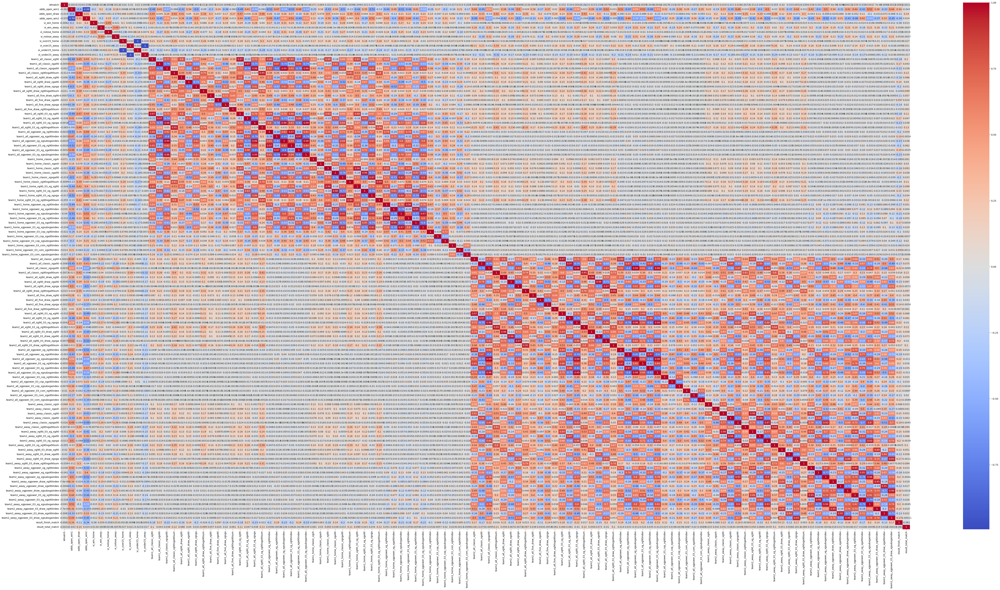

In [56]:
# plt.figure(figsize=(80, 40))

corr_mx = data.corr(method='spearman')
# heatmap(corr_mx, annot=True,  cmap="coolwarm")

Имеет смысл среди всех групп столбцов, для которых коэффициент корреляции по модулю превосходит 0.95, оставить только по одному:

Новый размер массива:  (56860, 80)


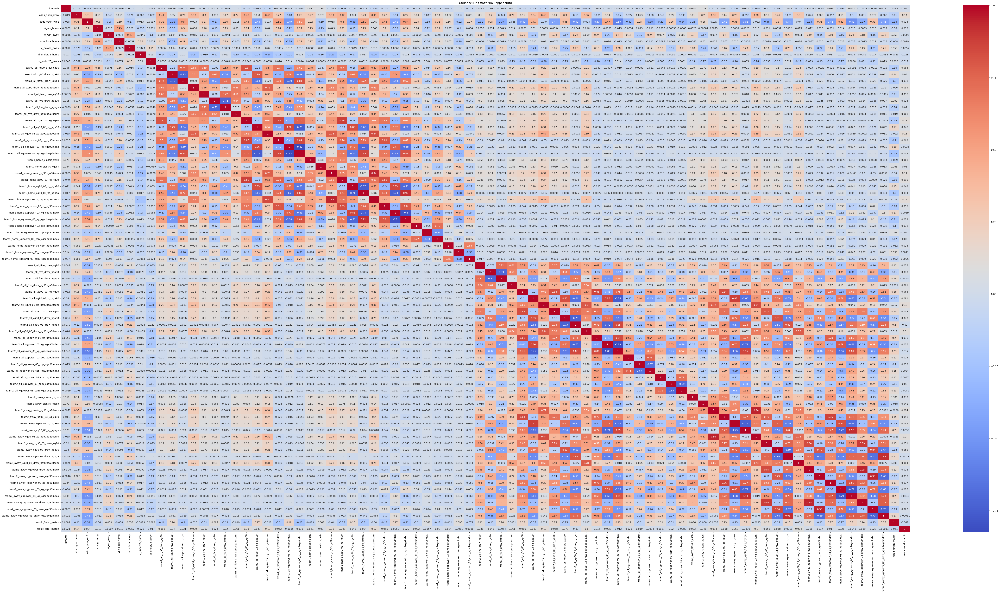

In [57]:
boarder = 0.95
excludable = []

# пробегаем по нижнему треугольнику:
for row in range(1, data.shape[1]): 
    for column in range(0, row):
        if abs(corr_mx.iloc[row, column]) >= boarder:
            excludable.append(data.columns[column])

# удаляем и сохраняем:
data_cut = data.drop(columns=excludable,    inplace=False)
print("Новый размер массива: ", data_cut.shape)
data_cut.to_csv(data_name + "_cut.csv")

# смотрим на обновлённую матрицу корреляций
corr_mx_cut = corr_mx.drop(columns=excludable, inplace=False)
corr_mx_cut.drop(index=excludable,             inplace=True)

# plt.figure(figsize=(80, 40))
# heatmap(corr_mx_cut, annot=True,  cmap="coolwarm")
# plt.title("Обновлённая матрица корреляций");

Исчезли ярко-красные ячейки (*картинка только для уменьшенного датасета*).

In [ ]:
data_name = "data_cut.csv"
data_cut = pd.read_csv(data_name)